In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
%matplotlib inline

## Step 1: camera calibration

Compute the camera calibration matrix and distortion coefficients given a set of provided chessboard images.

In [2]:
NX = 9  # number of inner chessboard points in the x axis
NY = 6  # number of inner chessboard points in the x axis
obj_points_list = []  # list of obj_points, which are ground truth points for the coordinates in 3d coordinates
detected_points_list = []  # list of img_points, which are corners detected in chessboard images in 2d coordinates

obj_points = np.zeros((NX * NY, 3), np.float32)
# e.g, [[ 0.,  0.,  0.], [ 1.,  0.,  0.], [ 2.,  0.,  0], ..., [0, 1, 0], [1, 1, 0], [2, 1, 0],...]
# z coordinate is always 0
obj_points[:, :2] = np.mgrid[0 : NX, 0 : NY].T.reshape(-1, 2)

In [3]:
CALIBRATION_IMAGE_DIR = 'camera_cal'
calibration_image_names = [CALIBRATION_IMAGE_DIR + '/' + filename for filename in os.listdir(CALIBRATION_IMAGE_DIR)]

In [4]:
for calibration_image_name in calibration_image_names:
    # read in image
    img = mpimg.imread(calibration_image_name)
    # convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # find the chessboard corners
    ret, detected_points = cv2.findChessboardCorners(gray, (NX, NY), None)
    
    if ret:
        detected_points_list.append(detected_points)
        obj_points_list.append(obj_points)  

# correct for distortions
_, mtx, dist, _, _ = cv2.calibrateCamera(obj_points_list, detected_points_list, gray.shape[::-1], None, None)

In [5]:
def undistort(img):
     return cv2.undistort(img, mtx, dist, None, mtx)

### calibration demo

This section is for illustration purpose only

#### draw detected chessboard corners

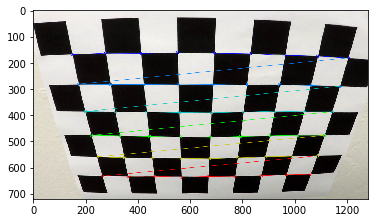

In [6]:
img = mpimg.imread(calibration_image_names[11])
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, detected_points = cv2.findChessboardCorners(gray, (NX, NY), None)
if ret:
    cv2.drawChessboardCorners(img, (NX, NY), detected_points, ret)
    plt.imshow(img)

#### apply undistortion to a chessboard image

In [7]:
def undistortion_demo(img_path):
    img = mpimg.imread(img_path)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistort(img))
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

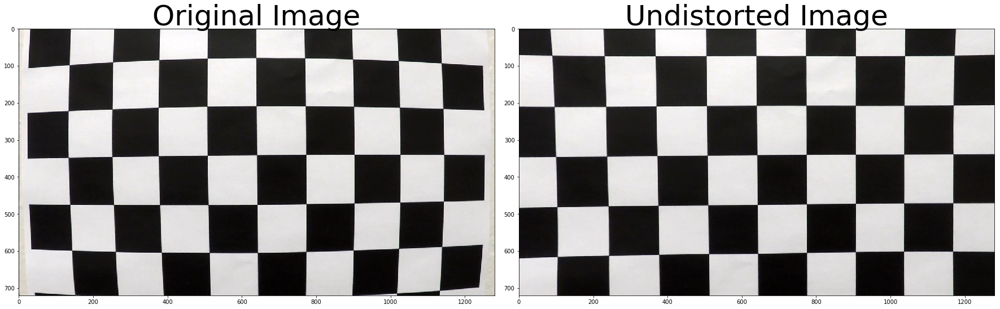

In [8]:
undistortion_demo(calibration_image_names[0])

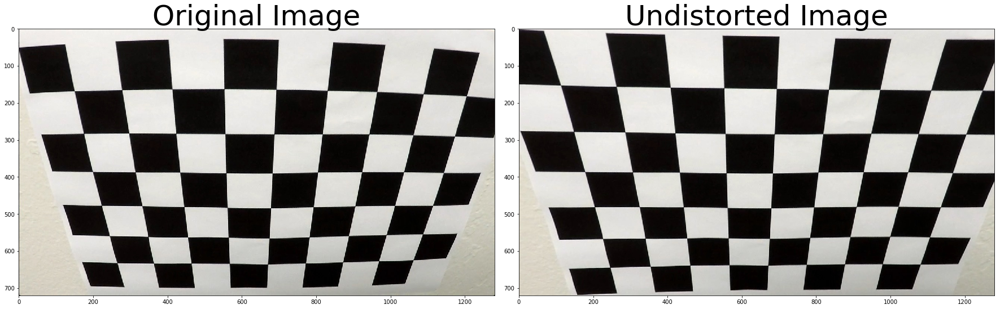

In [9]:
undistortion_demo(calibration_image_names[11])

#### apply undistortion to raw images

In [10]:
TEST_IMAGE_DIR = 'test_images'
test_image_names = [TEST_IMAGE_DIR + '/' + filename for filename in os.listdir(TEST_IMAGE_DIR)]

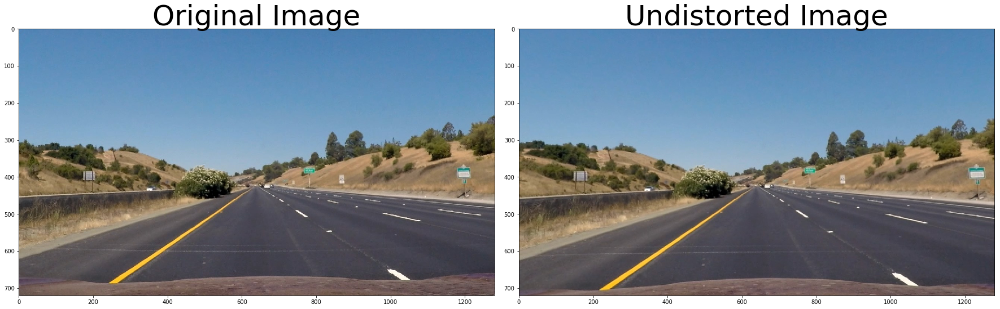

In [11]:
undistortion_demo(test_image_names[0])

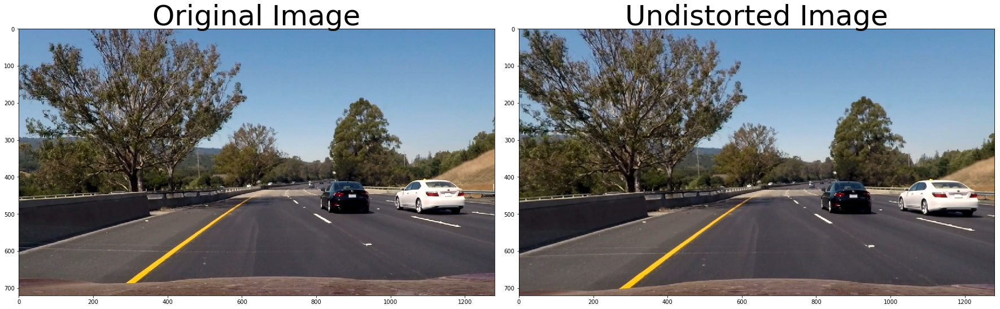

In [12]:
undistortion_demo(test_image_names[-1])

## Step 2: create binary image

In [212]:
def create_binary_image(img, saturation_threshold=(120, 255), sobelx_threshold=(20, 100), demo=False):
    """if demo is true, show intermediary plots"""
    # Convert to HSL color space
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    light_channel = hsv[:,:,1]
    saturation_channel = hsv[:,:,2]
    
    # Threshold saturation channel
    saturation_binary = np.zeros_like(saturation_channel)
    saturation_binary[(saturation_channel >= saturation_threshold[0])
                      & (saturation_channel <= saturation_threshold[1])] = 1
    
    # Sobel x
    sobelx = cv2.Sobel(light_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobelx = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    # Threshold x gradient
    sobelx_binary = np.zeros_like(scaled_sobelx)
    sobelx_binary[(scaled_sobelx >= sobelx_threshold[0]) & (scaled_sobelx <= sobelx_threshold[1])] = 1
    sobelx_binary = sobelx_binary
    
    final_binary = np.clip(sobelx_binary + saturation_binary, 0, 1)
    
    if demo:
        fig, ax = plt.subplots(2, 3, figsize=(24, 9))
        demo_images = [
            (img, 'original image', None),
            (light_channel, 'light channel', 'gray'),
            (saturation_channel, 'saturation channel', 'gray'),
            (saturation_binary, 'saturation binary', 'gray'),
            (sobelx_binary, 'sobelx_binary', 'gray'),
            (final_binary, 'final binary output', 'gray')
        ]

        for i in range(len(demo_images)):
            ax[int(i / 3), i % 3].imshow(demo_images[i][0], cmap=demo_images[i][2])
            ax[int(i / 3), i % 3].axis('off')
            ax[int(i / 3), i % 3].title.set_text(demo_images[i][1])
        plt.show()
    
    return final_binary

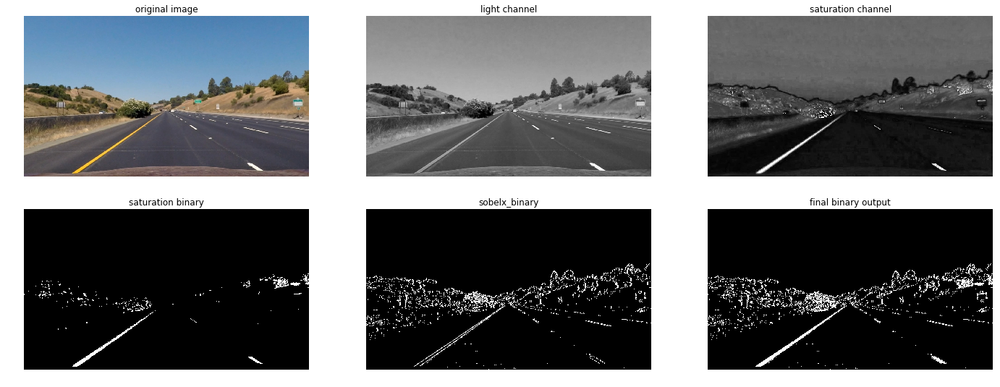

In [213]:
img_example = mpimg.imread(test_image_names[0])
undistorted_example = undistort(img_example)
binary_example = create_binary_image(undistorted_example, demo=True)

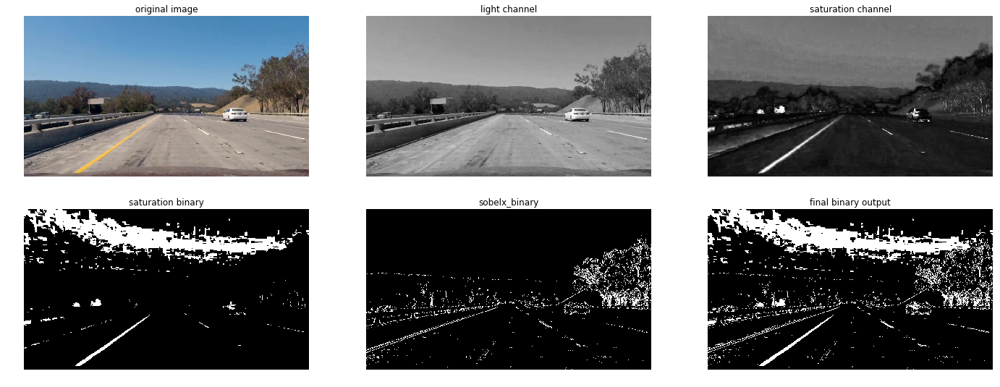

In [214]:
img_example2 = mpimg.imread('project_video_frames/frame564.jpg')
undistorted_example2 = undistort(img_example2)
binary_example2 = create_binary_image(undistorted_example2, demo=True)

## Step 3: perspective transform

Apply a perspective transform to rectify image and "birds-eye view"

In [16]:
from collections import namedtuple
# source points: a list of 4 manualy points that should be rectangle in birds-eye view.
# rectangular_points: a list of 4 points that mark where the source pointsshould be in a birds-eye view correspondingly
PerspectiveCalibration = namedtuple("PersepctiveCalibration", "source_points rectangle_points image_path")

In [17]:
calibration_parameters = [
    PerspectiveCalibration(
        np.float32([[559, 478], [736, 478], [1042, 672], [297, 672]]),
        np.float32([[297, 478], [1042, 478], [1042, 672], [297, 672]]),
        TEST_IMAGE_DIR + '/' + 'straight_lines2.jpg'),
    PerspectiveCalibration(
        np.float32([[539, 495], [748, 495], [1007, 668], [295, 668]]),
        np.float32([[295, 495], [1007, 495], [1007, 668], [295, 668]]),
        TEST_IMAGE_DIR + '/' + 'straight_lines1.jpg'),
    PerspectiveCalibration(
        np.float32([[460, 565], [878, 565], [1026, 659], [334, 659]]),
        np.float32([[334, 565], [1026, 565], [1026, 659], [334, 659]]),
        TEST_IMAGE_DIR + '/' + 'test3.jpg')
    ]

#### draw the source points on the image that I manually selected them from

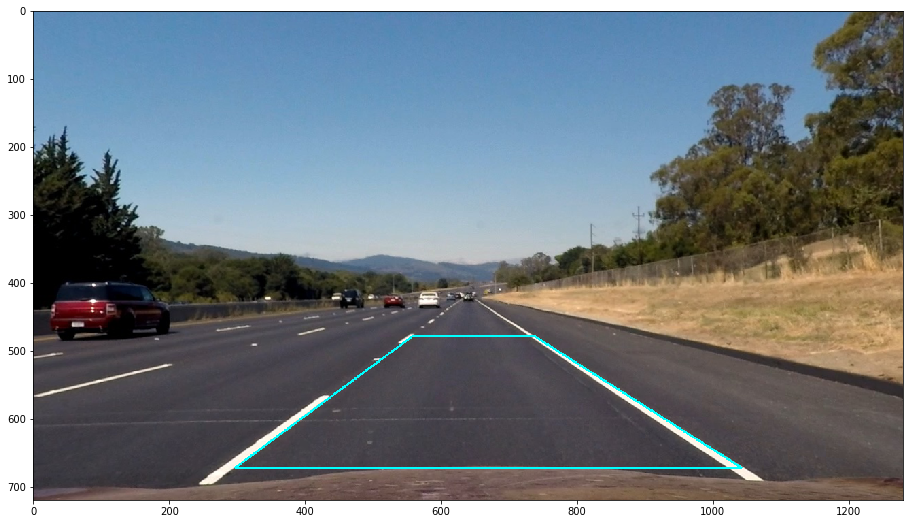

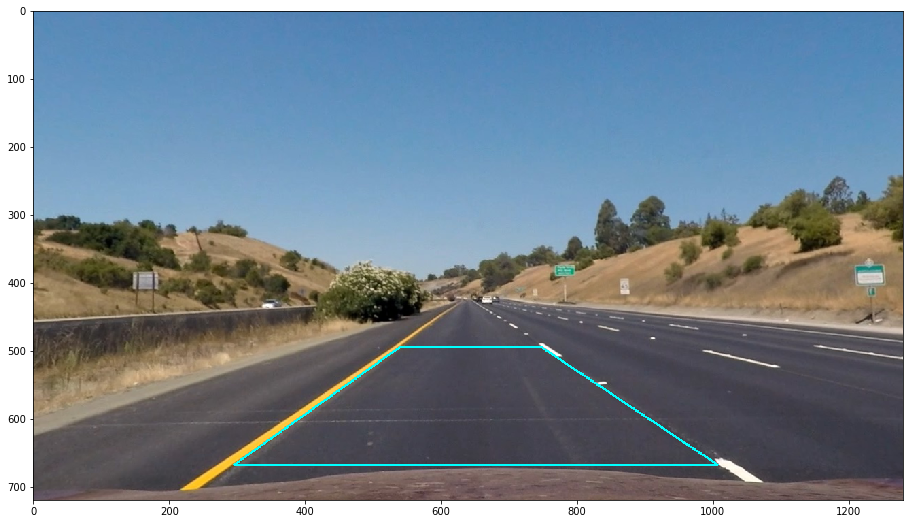

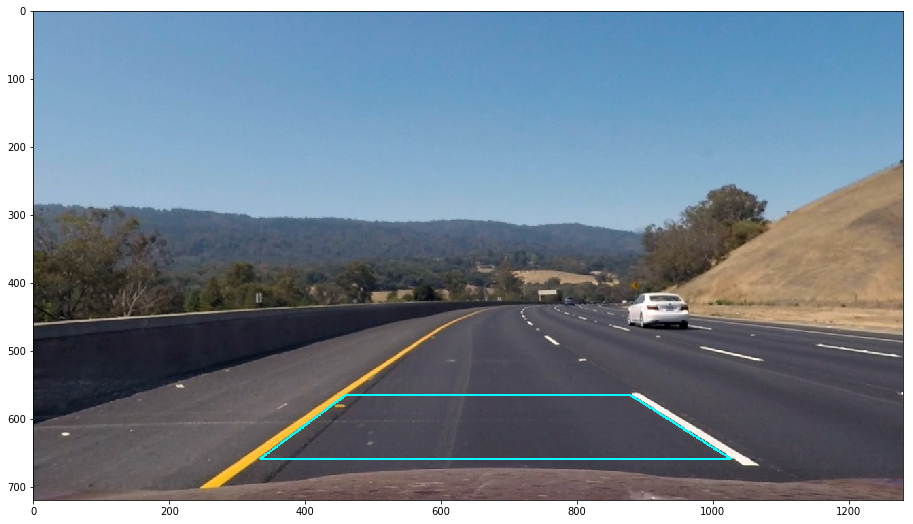

In [18]:
for c in calibration_parameters: 
    img = mpimg.imread(c.image_path)
    undistorted = undistort(img)
    cv2.polylines(undistorted, [np.int32(c.source_points)], True, (0,255,255), thickness=2)

    f, ax = plt.subplots(1, 1, figsize=(24, 9))
    ax.imshow(undistorted)

In [19]:
# calculate perspective transform parameter
M_list = []
M_inverse_list = []
for c in calibration_parameters: 
    M_list.append(cv2.getPerspectiveTransform(c.source_points, c.rectangle_points))
    M_inverse_list.append(cv2.getPerspectiveTransform(c.rectangle_points, c.source_points))

# average transformations found based on a few warped images
M = np.array(M_list).mean(axis=0)
M_inverse = np.array(M_inverse_list).mean(axis=0)

# wrapper function to easily transform perspectives
def warp(img):
    img_size = img.shape[1], img.shape[0]
    return cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

def unwarp(img):
    img_size = img.shape[1], img.shape[0]
    return cv2.warpPerspective(img, M_inverse, img_size, flags=cv2.INTER_LINEAR)

### perspective -> bird eye view transform demo

In [20]:
def warp_demo(img_path):
    img = mpimg.imread(img_path)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(undistort(img))
    ax1.set_title('Undistorted Image', fontsize=50)
    ax2.imshow(warp(undistort(img)))
    ax2.set_title('Top Down Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

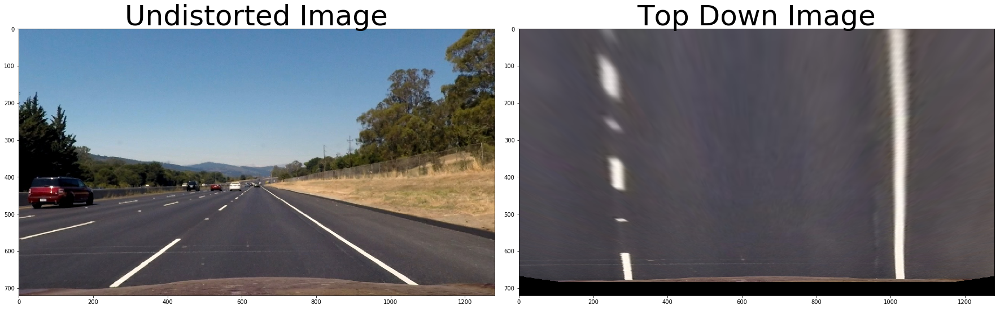

In [21]:
warp_demo(TEST_IMAGE_DIR + '/' + 'straight_lines2.jpg')

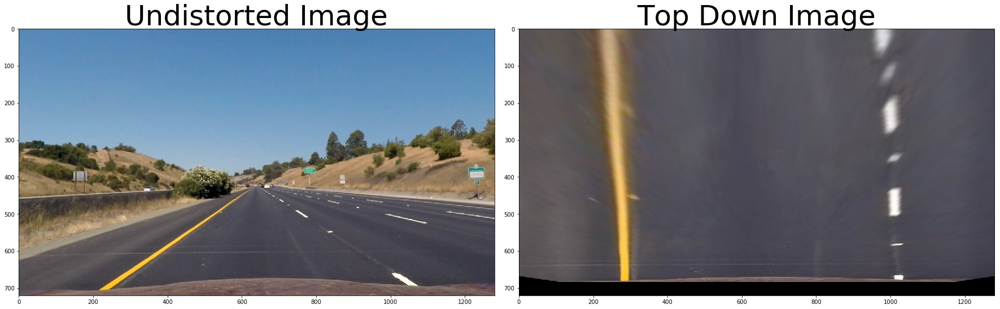

In [22]:
warp_demo(TEST_IMAGE_DIR + '/' + 'straight_lines1.jpg')

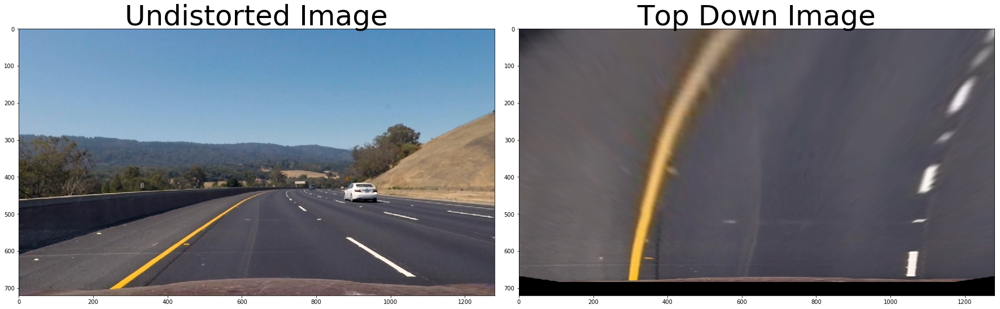

In [23]:
warp_demo(TEST_IMAGE_DIR + '/' + 'test3.jpg')

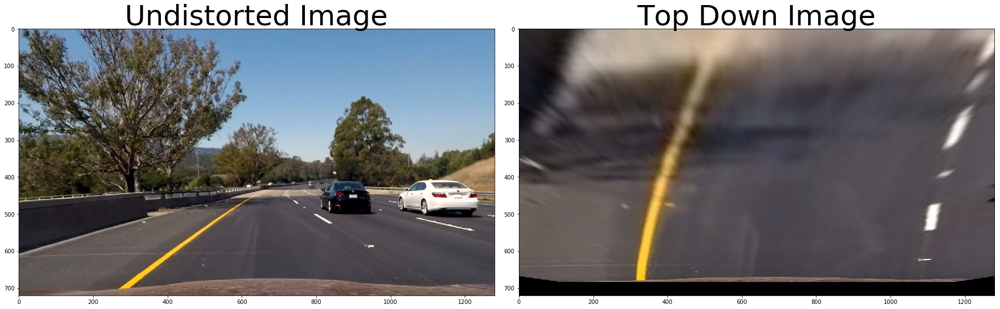

In [24]:
warp_demo(TEST_IMAGE_DIR + '/' + 'test6.jpg')

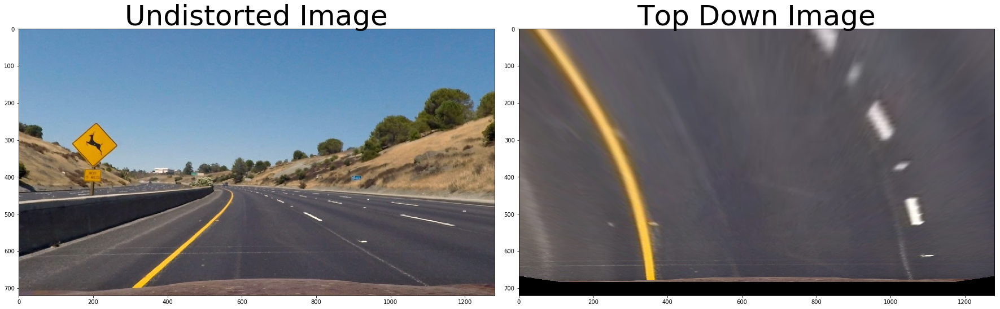

In [25]:
warp_demo(TEST_IMAGE_DIR + '/' + 'test2.jpg')

#### Apply a perspective transform to rectify binary image ("birds-eye view")

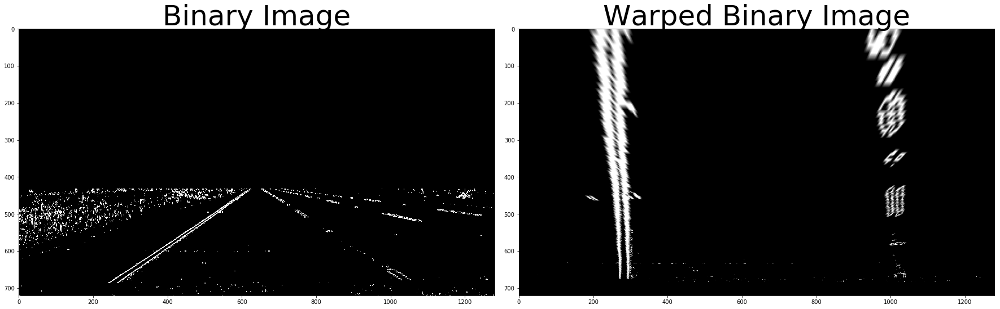

In [26]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(binary_example, cmap='gray')
ax1.set_title('Binary Image', fontsize=50)
binary_warped_example = warp(binary_example)
ax2.imshow(binary_warped_example, cmap='gray')
ax2.set_title('Warped Binary Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

## Step 4: Detect lane pixels

In [157]:
N_WINDOWS = 5 # number of sliding windows
MARGIN = 100 # the width of the search windows +/- margin
MINIMAL_PIXELS = 50 # minimum number of pixels found to recenter window


def detect_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0] / 2):,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] / 2)
    # Current positions to be updated for each window
    leftx_current = np.argmax(histogram[:midpoint])
    rightx_current = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows
    window_height = np.int(binary_warped.shape[0] / N_WINDOWS)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzeroy, nonzerox = np.array(binary_warped.nonzero())
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(N_WINDOWS):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - MARGIN
        win_xleft_high = leftx_current + MARGIN
        win_xright_low = rightx_current - MARGIN
        win_xright_high = rightx_current + MARGIN
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0, 1, 0), 2) 
        cv2.rectangle(out_img,(win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 1, 0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high)\
            & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high)\
            & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > MINIMAL_PIXELS:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > MINIMAL_PIXELS:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx, lefty = nonzerox[left_lane_inds], nonzeroy[left_lane_inds] 
    rightx, righty = nonzerox[right_lane_inds], nonzeroy[right_lane_inds]
    
    out_img[lefty, leftx] = [1, 0, 0]
    out_img[righty, rightx] = [0, 0, 1]
    
    return out_img, (leftx, lefty, rightx, righty)

### detect lane pixels demo

In [40]:
lane_pixel_output_img, lane_pixels_example = detect_lane_pixels(binary_warped_example)

In [31]:
def detect_lane_pixels_demo(img_path):
    img = mpimg.imread(img_path)
    img = undistort(img)
    img = create_binary_image(img)
    binary_warped = warp(img)
    lane_pixels, _ = detect_lane_pixels(binary_warped)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(binary_warped, cmap='gray')
    ax1.set_title('Warped Binary Image', fontsize=50)
    ax2.imshow(lane_pixels)
    ax2.set_title('Lane Pixels Detected', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

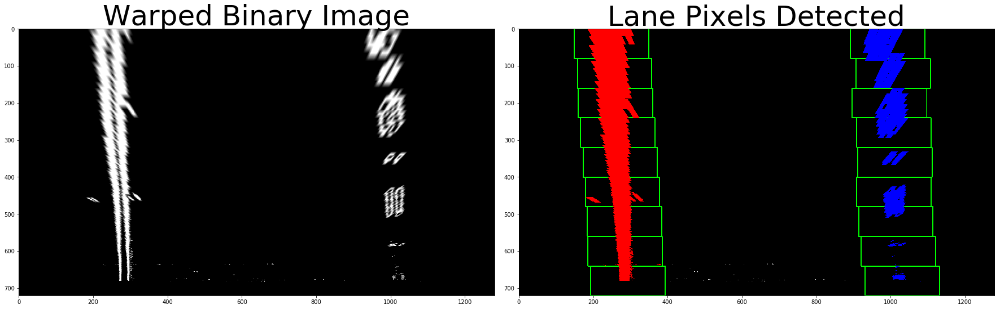

In [32]:
detect_lane_pixels_demo(test_image_names[0])

## Step 5: fit lane to polynomial

In [261]:
def polynomial_fit(lane_pixels):
    (leftx, lefty, rightx, righty) = lane_pixels
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit

def get_fitted_pixels(image_size, left_fit, right_fit):
    """fit: output of polynomial_fit"""
    # Generate x and y values for plotting
    fity = np.linspace(0, image_size[0]-1, image_size[0])
    left_fitx = left_fit[0] * fity ** 2 + left_fit[1] * fity + left_fit[2]
    right_fitx = right_fit[0] * fity ** 2 + right_fit[1] * fity + right_fit[2]
    return (fity, left_fitx, right_fitx)

In [241]:
def polynomial_fit_demo(binary_warped, lane_pixels):
    image_size = binary_warped.shape
    (fity, left_fitx, right_fitx) = get_fitted_pixels(image_size, polynomial_fit(lanel_pixels))
    # Create an output image to draw on and visualize the result
    fig = plt.figure()
    plt.imshow(binary_warped, cmap='gray')
    plt.plot(left_fitx, fity, color='green', linewidth=5)
    plt.plot(right_fitx, fity, color='green', linewidth=5)
    plt.xlim(0, binary_warped.shape[1])
    plt.ylim(binary_warped.shape[0], 0)
    return fig

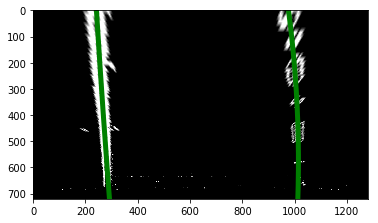

In [254]:
left_fit_example, right_fit_example = polynomial_fit(lane_pixels_example)
fitted_pixels_example = get_fitted_pixels(binary_warped_example.shape, fit_example)
fitted_output_example = polynomial_fit_demo(binary_warped_example, lane_pixels_example)

##  Step 6: find curvature and position of vehicle

In [297]:
# Define conversions in x and y from pixels space to meters
METER_PER_PIXEL_Y = 30 / 720
METER_PER_PIXEL_X = 3.7 / 700

def _find_curvature_in_meter(fit, y):
    a, b, _ = fit
    new_a = a / (METER_PER_PIXEL_Y ** 2) * METER_PER_PIXEL_X
    new_b = b / METER_PER_PIXEL_Y * METER_PER_PIXEL_X
    curvature = ((1 + ( 2 * new_a * y * METER_PER_PIXEL_Y + new_b) ** 2) ** 1.5) / np.absolute(2 * new_a)
    return curvature

def find_average_curvature_in_meter(image_size, left_fit, right_fit):
    "average the curvature of the two lanes"
    height = image_size[0]
    left_curvature = _find_curvature_in_meter(left_fit, height)
    right_curvature = _find_curvature_in_meter(right_fit, height)
    return (left_curvature + right_curvature) / 2

In [298]:
def _get_fitted_value(fit, y):
    a, b, c = fit
    return a * y ** 2 + b * y + c
    
def find_position_in_meter(image_size, left_fit, right_fit):
    height = image_size[0]
    left_intercept = _get_fitted_value(left_fit, height)
    right_intercept = _get_fitted_value(right_fit, height)
    lane_middle = (left_intercept + right_intercept) / 2
    vehicle_middle = image_size[1] / 2
    return (vehicle_middle - lane_middle) * METER_PER_PIXEL_X

In [299]:
left_fit, right_fit = fit_example
print(find_average_curvature_in_meter(binary_warped_example.shape, left_fit_example, right_fit_example))
print(find_position_in_meter(binary_warped_example.shape, left_fit_example, right_fit_example))

8619.93891645
-0.0641569177271


## Step 6: unwarp the detected lane boundaries back onto the original image

In [300]:
def unwarp_fitted_lanes(original_img, fitted_pixels):
    lane_overlay = np.zeros_like(original_img)
    (fity, left_fitx, right_fitx) = fitted_pixels

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, fity]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, fity])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(lane_overlay, np.int_([pts]), (0,255, 0))

    # Combine the result with the original image
    output_img = cv2.addWeighted(original_img, 1, unwarp(lane_overlay), 0.3, 0)
    return output_img

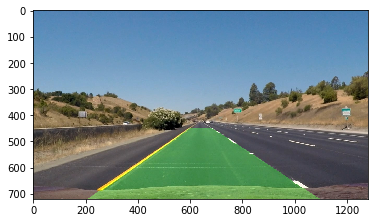

In [301]:
plt.imshow(unwarp_fitted_lanes(img_example, fitted_pixels_example))

## Pipeline

In [302]:
FONTFACE = cv2.FONT_HERSHEY_SIMPLEX

def detect_lanes(img, demo=False):
    undistorted_img = undistort(img)
    binary_img = create_binary_image(undistorted_img)
    binary_warped_img = warp(binary_img)
    bianry_lane_detected_img, lane_pixels = detect_lane_pixels(binary_warped_img)
    left_fit, right_fit = polynomial_fit(lane_pixels)
    image_size = binary_warped_img.shape
    fitted_pixels = get_fitted_pixels(image_size, left_fit, right_fit)
    output_img = unwarp_fitted_lanes(img, fitted_pixels)
    
    curvature = find_average_curvature_in_meter(image_size, left_fit, right_fit)
    curvature_text = 'curvature: ' + str(round(curvature)) + ' m'
    position = find_position_in_meter(image_size, left_fit, right_fit)
    position_text = 'position: ' + str(round(position * 100, 1)) + ' cm'
    cv2.putText(output_img, curvature_text, (100, 100), FONTFACE, 2, (255, 255, 255), 2, cv2.LINE_AA)
    cv2.putText(output_img, position_text, (100, 200), FONTFACE, 2, (255, 255, 255), 2, cv2.LINE_AA)
    
    if demo:
        fig, ax = plt.subplots(2, 3, figsize=(24, 9))
        demo_images = [
            (img, 'original image', None),
            (binary_img, 'binary_img', 'gray'),
            (binary_warped_img, 'binary_warped_img', 'gray'),
            (bianry_lane_detected_img, 'bianry_lane_detected_img', 'gray'),
            (output_img, 'output_img', None),
        ]

        for i in range(len(demo_images)):
            ax[int(i / 3), i % 3].imshow(demo_images[i][0], cmap=demo_images[i][2])
            ax[int(i / 3), i % 3].axis('off')
            ax[int(i / 3), i % 3].title.set_text(demo_images[i][1])
        plt.show()
    return output_img

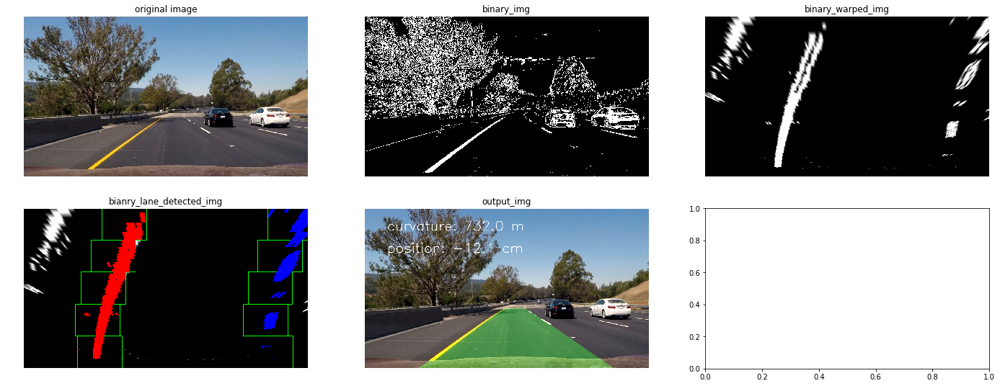

In [303]:
_ = detect_lanes(mpimg.imread(test_image_names[7]), demo=True)

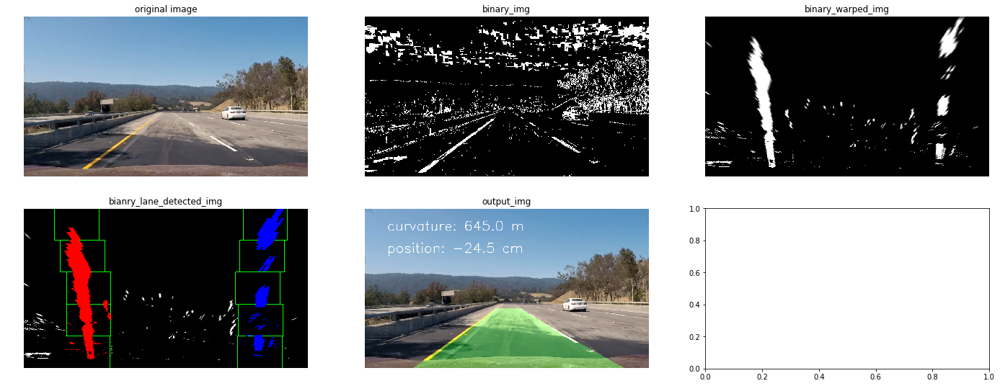

In [304]:
_ = detect_lanes(mpimg.imread('project_video_frames/frame547.jpg'), demo=True)

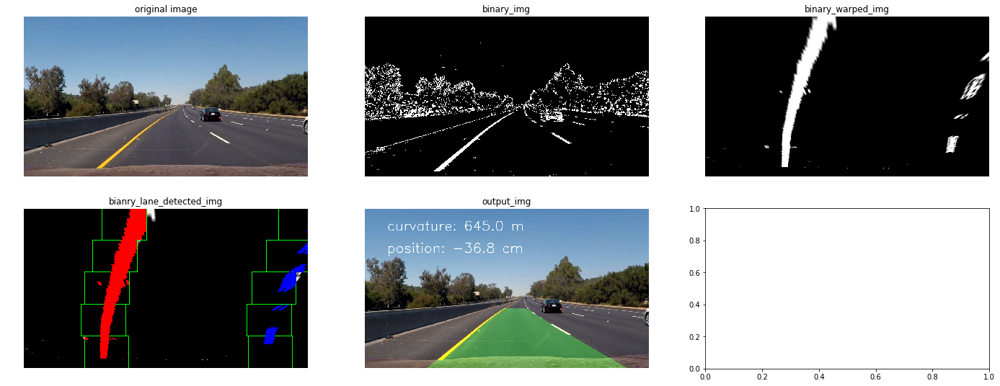

In [305]:
_ = detect_lanes(mpimg.imread('project_video_frames/frame1210.jpg'), demo=True)

## test on videos

In [306]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [307]:
output_filename = 'project_video_output.mp4'
video = VideoFileClip("project_video.mp4")
output = video.fl_image(detect_lanes) #NOTE: this function expects color images!!
%time output.write_videofile(output_filename, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [04:37<00:00,  4.43it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 4min 32s, sys: 56.3 s, total: 5min 29s
Wall time: 4min 39s


In [308]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_filename))